### Semantic Segmentation

#### Import Modules

In [1]:
# IMPORT MODULES
# Import Import Numpy, TensorFlow, Scipy, Keras
import sys
import time
import os
import numpy as np 
import pandas as pd 
from glob import glob
import cv2
import matplotlib.pyplot as plt
from skimage.segmentation import mark_boundaries
import pickle
import math
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from scipy.signal import find_peaks_cwt
import random
from sklearn.utils import shuffle
import csv
import tensorflow as tf
from tensorflow.contrib.layers import flatten
from tensorflow.examples.tutorials.mnist import input_data
import keras
from keras.datasets import cifar10
from keras.models import Sequential,model_from_json
from keras.layers import Dense,Dropout,Activation,Flatten
from keras.layers import Convolution2D,MaxPooling2D
from keras.layers import Flatten,Lambda,ELU
from keras.optimizers import SGD,Adam,RMSprop
from keras.layers.convolutional import Conv2D
from keras.layers.normalization import BatchNormalization
from keras.utils import np_utils
from keras.preprocessing.image import ImageDataGenerator
from keras.initializers import glorot_uniform
from sklearn.cross_validation import train_test_split
import scipy.misc
from matplotlib.pyplot import imshow
from IPython.display import SVG
import json
from keras.models import Sequential, model_from_json
from collections import namedtuple
from keras.models import Model, load_model
from keras.layers import Input, BatchNormalization, Dropout, Lambda
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.layers.pooling import MaxPooling2D
from keras.layers.merge import concatenate
from keras.layers import UpSampling2D
import time
from skimage import data, color
from skimage.transform import rescale, resize, downscale_local_mean
%matplotlib inline
print('Import Modules')

Import Modules


Using TensorFlow backend.


#### Load Data

In [2]:
# LOAD DATA
# Change Directory
os.chdir('..')

In [3]:
# LOAD DATA
# Load Training Data Directories
train_image_dir = "Data/Images/Train/"
train_label_dir = "Data/Ground-Truth/Train/"
train_dirs = ["jena/", "zurich/", "weimar/", "ulm/", "tubingen/", "stuttgart/",
            "strasbourg/", "monchengladbach/", "krefeld/", "hanover/",
            "hamburg/", "erfurt/", "dusseldorf/", "darmstadt/", "cologne/",
            "bremen/", "bochum/", "aachen/"]

In [4]:
# LOAD DATA
# Define a Function to Convert Label Image to Binary Image
def create_binary_labels(img):
    # Create Binary Image
    binary_img = np.zeros((img.shape[0], img.shape[1]))
    # Create For Loops for Check ground Pixels
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            if img[i,j][0] == 128 and img[i,j][1] == 64 and img[i,j][2] == 128:
                binary_img[i,j] = 255
            else:
                binary_img[i,j] = 0
    return binary_img

In [33]:
# LOAD DATA
# Define a Function to Perform Gamma Correction
def adjust_gamma(image, gamma=1.0):
    invGamma = 1.0/gamma
    table = np.array([((i/255.0) ** invGamma) * 255
      for i in np.arange(0, 256)]).astype("uint8")

    return cv2.LUT(image, table)

# Initialize Array
gamma_array = np.array([0.5, 0.65, 0.85, 1.0, 1.45, 1.75, 2.0])

In [6]:
# LOAD DATA
#Create Empty Array for Training Images
x_train = []
y_train = []

# Create a For Loop to Import Training Data
for dir_step, dir in enumerate(train_dirs):
    # Load Current Directory
    current_dir = train_image_dir + dir
    
    # Load Filenames in Current Directory
    filenames = os.listdir(current_dir)
    
    # Create For Loop for Import Images from Current Directory
    for step, filename in enumerate(filenames):
        # Print Current Loading Status
        if step % 10 == 0:
            print("Training Data Directory: %d/%d, Step: %d/%d" % (dir_step, len(train_dirs)-1,step, \
                                                                   len(filenames)-1))
        
        # Check Image ID
        image_id = filename.split("_left")[0]

        # Read the Image
        image_path = current_dir + filename
        image = cv2.imread(image_path)
        
        # Randomly Select Gamma
        gamma = random.choice(gamma_array)
    
        # Perform Gamma Correction
        image = adjust_gamma(image, gamma = gamma)

        # Resize the Image
        image_small = cv2.resize(image, (144,144), interpolation=cv2.INTER_NEAREST)
        
        # Flatten Image and Append 
        image_flat = image_small.flatten().tolist()
        x_train += image_flat

        # Read Label Image
        label_image_path = train_label_dir + dir + image_id + "_gtFine_color.png"
        label_image = cv2.imread(label_image_path)
        
        # Resize the Label Image
        label_image_small = cv2.resize(label_image, (144,144), interpolation=cv2.INTER_NEAREST)

        # Convert to Binary Image
        binary_label_image = create_binary_labels(label_image_small)
        
        # Flatten Image and Append 
        label_image_flat = binary_label_image.flatten().tolist()
        y_train += label_image_flat

Training Data Directory: 0/17, Step: 0/118
Training Data Directory: 0/17, Step: 10/118
Training Data Directory: 0/17, Step: 20/118
Training Data Directory: 0/17, Step: 30/118
Training Data Directory: 0/17, Step: 40/118
Training Data Directory: 0/17, Step: 50/118
Training Data Directory: 0/17, Step: 60/118
Training Data Directory: 0/17, Step: 70/118
Training Data Directory: 0/17, Step: 80/118
Training Data Directory: 0/17, Step: 90/118
Training Data Directory: 0/17, Step: 100/118
Training Data Directory: 0/17, Step: 110/118
Training Data Directory: 1/17, Step: 0/121
Training Data Directory: 1/17, Step: 10/121
Training Data Directory: 1/17, Step: 20/121
Training Data Directory: 1/17, Step: 30/121
Training Data Directory: 1/17, Step: 40/121
Training Data Directory: 1/17, Step: 50/121
Training Data Directory: 1/17, Step: 60/121
Training Data Directory: 1/17, Step: 70/121
Training Data Directory: 1/17, Step: 80/121
Training Data Directory: 1/17, Step: 90/121
Training Data Directory: 1/17, S

Training Data Directory: 10/17, Step: 230/247
Training Data Directory: 10/17, Step: 240/247
Training Data Directory: 11/17, Step: 0/108
Training Data Directory: 11/17, Step: 10/108
Training Data Directory: 11/17, Step: 20/108
Training Data Directory: 11/17, Step: 30/108
Training Data Directory: 11/17, Step: 40/108
Training Data Directory: 11/17, Step: 50/108
Training Data Directory: 11/17, Step: 60/108
Training Data Directory: 11/17, Step: 70/108
Training Data Directory: 11/17, Step: 80/108
Training Data Directory: 11/17, Step: 90/108
Training Data Directory: 11/17, Step: 100/108
Training Data Directory: 12/17, Step: 0/220
Training Data Directory: 12/17, Step: 10/220
Training Data Directory: 12/17, Step: 20/220
Training Data Directory: 12/17, Step: 30/220
Training Data Directory: 12/17, Step: 40/220
Training Data Directory: 12/17, Step: 50/220
Training Data Directory: 12/17, Step: 60/220
Training Data Directory: 12/17, Step: 70/220
Training Data Directory: 12/17, Step: 80/220
Training 

In [7]:
# LOAD DATA
# Check Size of Data
image_feature_size=int(len(x_train))
print("Feature Size:", image_feature_size)

# Revert to the Original Image Shapes
x_train = np.array(x_train).reshape(2975, 144, 144, 3)
print("Feature Size:", x_train.shape)

# Check Size of Data
label_feature_size=int(len(y_train))
print("Feature Size:", label_feature_size)

# Revert to the Original Image Shapes
y_train = np.array(y_train).reshape(2975, 144, 144, 1)
print("Feature Size:", y_train.shape)

Feature Size: 185068800
Feature Size: (2975, 144, 144, 3)
Feature Size: 61689600
Feature Size: (2975, 144, 144, 1)


Text(0.5,1,'Label Image:')

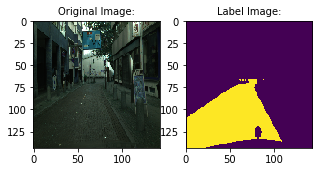

In [8]:
# LOAD DATA
# Plot Images
index = random.randint(0,2975)
fig, (axis1, axis2) = plt.subplots(1,2,figsize=(5,5))
axis1.imshow(x_train[index])
axis2.imshow(np.array(y_train[index]).reshape(144,144))
axis1.set_title('Original Image:',fontsize=10)
axis2.set_title('Label Image:',fontsize=10)

In [9]:
# LOAD DATA
# Load Training Data Directories
valid_image_dir = "Data/Images/Val/"
valid_label_dir = "Data/Ground-Truth/Val/"
valid_dirs = ["frankfurt/", "lindau/", "munster/"]

In [37]:
# LOAD DATA
#Create Empty Array for Validation Images
x_valid = []
y_valid = []

# Create a For Loop to Import Validation Data
for dir_step, dir in enumerate(valid_dirs):
    # Load Current Directory
    current_dir = valid_image_dir + dir
    
    # Load Filenames in Current Directory
    filenames = os.listdir(current_dir)
    
    # Create For Loop for Import Images from Current Directory
    for step, filename in enumerate(filenames):
        # Print Current Loading Status
        if step % 10 == 0:
            print("Validation Data Directory: %d/%d, Step: %d/%d" % (dir_step, len(valid_dirs)-1,step, \
                                                                     len(filenames)-1))
        
        # Check Image ID
        image_id = filename.split("_left")[0]

        # Read the Image
        image_path = current_dir + filename
        image = cv2.imread(image_path)
        
        # Randomly Select Gamma
        gamma = random.choice(gamma_array)
    
        # Perform Gamma Correction
        #image = adjust_gamma(image, gamma = gamma)

        # Resize the Image
        image_small = cv2.resize(image, (144,144), interpolation=cv2.INTER_NEAREST)
        
        # Flatten Image and Append 
        image_flat = image_small.flatten().tolist()
        x_valid += image_flat

        # Read Label Image
        label_image_path = valid_label_dir + dir + image_id + "_gtFine_color.png"
        label_image = cv2.imread(label_image_path)
        
        # Resize the Label Image
        label_image_small = cv2.resize(label_image, (144,144), interpolation=cv2.INTER_NEAREST)

        # Convert to Binary Image
        binary_label_image = create_binary_labels(label_image_small)
        
        # Flatten Image and Append 
        label_image_flat = binary_label_image.flatten().tolist()
        y_valid += label_image_flat

Validation Data Directory: 0/2, Step: 0/266
Validation Data Directory: 0/2, Step: 10/266
Validation Data Directory: 0/2, Step: 20/266
Validation Data Directory: 0/2, Step: 30/266
Validation Data Directory: 0/2, Step: 40/266
Validation Data Directory: 0/2, Step: 50/266
Validation Data Directory: 0/2, Step: 60/266
Validation Data Directory: 0/2, Step: 70/266
Validation Data Directory: 0/2, Step: 80/266
Validation Data Directory: 0/2, Step: 90/266
Validation Data Directory: 0/2, Step: 100/266
Validation Data Directory: 0/2, Step: 110/266
Validation Data Directory: 0/2, Step: 120/266
Validation Data Directory: 0/2, Step: 130/266
Validation Data Directory: 0/2, Step: 140/266
Validation Data Directory: 0/2, Step: 150/266
Validation Data Directory: 0/2, Step: 160/266
Validation Data Directory: 0/2, Step: 170/266
Validation Data Directory: 0/2, Step: 180/266
Validation Data Directory: 0/2, Step: 190/266
Validation Data Directory: 0/2, Step: 200/266
Validation Data Directory: 0/2, Step: 210/266

In [39]:
# LOAD DATA
# Check Size of Data
image_feature_size=int(len(x_valid))
print("Feature Size:", image_feature_size)

# Revert to the Original Image Shapes
x_valid = np.array(x_valid).reshape(500, 144, 144, 3)
print("Feature Size:", x_valid.shape)

# Check Size of Data
label_feature_size=int(len(y_valid))
print("Feature Size:", label_feature_size)

# Revert to the Original Image Shapes
y_valid = np.array(y_valid).reshape(500, 144, 144, 1)
print("Feature Size:", y_valid.shape)

Feature Size: 31104000
Feature Size: (500, 144, 144, 3)
Feature Size: 10368000
Feature Size: (500, 144, 144, 1)


#### Create Model

In [12]:
# CREATE MODEL
# Define a Function for Convolutional Block
def convolutional_block(input_tensor, depth, kernel, strides=(1, 1), padding="SAME", batchnorm = False):
    layer = tf.layers.conv2d(input_tensor, \
                             filters = depth, \
                             kernel_size = kernel, \
                             strides = strides, \
                             padding = padding, \
                             activation = tf.nn.relu)
    layer = tf.layers.dropout(layer, rate = 0.20, training = True)
    if batchnorm:
        layer = tf.layers.batch_normalization(layer, training = False)
        
    return layer

In [13]:
# CREATE MODEL
# Define a Function for Deconvolutional Block
def deconvolutional_block(input_tensor, filter_size, output_size, \
             out_channels, in_channels, \
             strides = [1, 1, 1, 1], name = False):
    input_shape = tf.shape(input_tensor)
    batch_size = input_shape[0]
    out_shape = tf.stack([batch_size, output_size, output_size, out_channels])
    filter_shape = [filter_size, filter_size, out_channels, in_channels]
    weights = tf.Variable(tf.truncated_normal(filter_shape, stddev=0.05))
    if name: 
        layer = tf.nn.conv2d_transpose(input_tensor, weights, out_shape, strides, padding = 'SAME', name = 'y_pred')
    else:
        layer = tf.nn.conv2d_transpose(input_tensor, weights, out_shape, strides, padding = 'SAME')
    return layer

In [14]:
# CREATE MODEL
# Define a Function for Architecture
def UNet(x, n_filters):
    c1_a = convolutional_block(x, 16 * n_filters, 3) 
    c1 = convolutional_block(c1_a, 16 * n_filters, 3) 
    c1 = tf.nn.max_pool(value=c1,
                            ksize=[1, 2, 2, 1],
                            strides=[1, 2, 2, 1],
                            padding='SAME')

    c2_a = convolutional_block(c1, 32 * n_filters, 3) 
    c2 = convolutional_block(c2_a, 32 * n_filters, 3)
    c2 = tf.nn.max_pool(value=c2,
                            ksize=[1, 2, 2, 1],
                            strides=[1, 2, 2, 1],
                            padding='SAME')

    c3_a = convolutional_block(c2, 64 * n_filters, 3) 
    c3 = convolutional_block(c3_a, 64 * n_filters, 3) 
    c3 = tf.nn.max_pool(value=c3,
                            ksize=[1, 2, 2, 1],
                            strides=[1, 2, 2, 1],
                            padding='SAME')


    c4_a = convolutional_block(c3, 128 * n_filters, 3) 
    c4 = convolutional_block(c4_a, 128 * n_filters, 3) 
    c4 = tf.nn.max_pool(value=c4,
                            ksize=[1, 2, 2, 1],
                            strides=[1, 2, 2, 1],
                            padding='SAME')

    c5_a = convolutional_block(c4, 256 * n_filters, 3) 
    c5 = convolutional_block(c5_a, 256 * n_filters, 3) 

    d1 = deconvolutional_block(c5, 2, 18, 128 * n_filters, 256 * n_filters, strides=[1, 2, 2, 1]) 
    cat1 = tf.concat([d1, c4_a], 3)
    cat1 = convolutional_block(cat1, 128 * n_filters, 3) 
    cat1 = convolutional_block(cat1, 128 * n_filters, 3) 

    d2 = deconvolutional_block(cat1, 2, 36, 64 * n_filters, 128 * n_filters, strides=[1, 2, 2, 1]) 
    cat2 = tf.concat([d2, c3_a], 3)
    cat2 = convolutional_block(cat2, 64 * n_filters, 3) 
    cat2 = convolutional_block(cat2, 64 * n_filters, 3) 

    d3 = deconvolutional_block(cat2, 2, 72, 32 * n_filters, 64 * n_filters, strides=[1, 2, 2, 1]) 
    cat3 = tf.concat([d3, c2_a], 3)
    cat3 = convolutional_block(cat3, 32 * n_filters, 3) 
    cat3 = convolutional_block(cat3, 32 * n_filters, 3) 

    d4 = deconvolutional_block(cat3, 2, 144, 16 * n_filters, 32 * n_filters, strides=[1, 2, 2, 1]) 
    cat4 = tf.concat([d4, c1_a], 3)
    cat4 = convolutional_block(cat4, 16 * n_filters, 3) 
    cat4 = convolutional_block(cat4, 16 * n_filters, 3) 

    y_pred = deconvolutional_block(d4, 1, 144, 1, 16 * n_filters, name = True)
    
    return y_pred

#### Set GPU Parameters

In [15]:
# SET GPU SETTINGS
# Configure
config = tf.ConfigProto(allow_soft_placement=True)
config.gpu_options.allocator_type = 'BFC'
config.gpu_options.per_process_gpu_memory_fraction = 0.80

#### Train

In [16]:
# TRAIN
# Set Placeholder
x = tf.placeholder(tf.float32, shape=[None, 144, 144, 3], name = 'x')
y = tf.placeholder(tf.float32, [None, 144, 144, 1], name = 'y')

print("Setting Placeholder")

Setting Placeholder


In [43]:
# TRAIN
# Set Training Pipeline
rate = 0.00001
batch_size = 8
epochs = 1000
y_pred = UNet(x,2)
loss_operation = tf.losses.mean_squared_error(y, y_pred)
optimizer = tf.train.AdamOptimizer(learning_rate = rate)
training_operation = optimizer.minimize(loss_operation)

print("Setting Training Pipeline")

Setting Training Pipeline


In [44]:
# TRAIN  
# Initialize Evaluation
correct_prediction = tf.losses.mean_squared_error(y, y_pred)

# Define Evaluation 
def evaluate(x_data, y_data):
    num_examples = len(x_data)
    total_accuracy = 0
    sess = tf.get_default_session()
    for offset in range(0, num_examples, batch_size):
        batch_x, batch_y = x_data[offset:offset + batch_size], y_data[offset:offset + batch_size]
        accuracy = sess.run(correct_prediction, feed_dict={x:batch_x, y:batch_y})
        total_accuracy += (accuracy * len(batch_x))
    return total_accuracy/num_examples

In [45]:
# TRAIN 
# Initialize Saver
saver = tf.train.Saver()

In [47]:
# TRAIN 
# Initialize 
training_loss_array = []
validation_loss_array = []

# Use Session to Test Model
with tf.Session() as sess:
    sess.run(tf.global_variables_initializer())
    num_examples = len(x_train)
    print("Training...")
    for i in range(epochs):
        x_train, y_train = shuffle(x_train, y_train)
        for offset in range(0, num_examples, batch_size):
            end = offset + batch_size
            batch_x, batch_y = x_train[offset:end], y_train[offset:end]
            loss_value, _ = sess.run([loss_operation, training_operation], feed_dict={x:batch_x, y:batch_y}) 
        training_loss_array.append(loss_value)
        validation_loss = evaluate(x_valid, y_valid)
        validation_loss_array.append(validation_loss)
        saver.save(sess,'./Model-Tensorflow/unet')
        print("Epoch {} ...".format(i+1))
        print("Training Loss = {:.3f}".format(loss_value)) 
        print("Validation Loss = {:.3f}".format(validation_loss))
        print("Model Saved")

Training...
Epoch 1 ...
Training Loss = 8115.909
Validation Loss = 8061.176
Model Saved
Epoch 2 ...
Training Loss = 7015.675
Validation Loss = 7088.119
Model Saved
Epoch 3 ...
Training Loss = 6530.034
Validation Loss = 6620.042
Model Saved
Epoch 4 ...
Training Loss = 5882.972
Validation Loss = 6165.325
Model Saved
Epoch 5 ...
Training Loss = 5994.021
Validation Loss = 6136.030
Model Saved
Epoch 6 ...
Training Loss = 6114.007
Validation Loss = 6396.058
Model Saved
Epoch 7 ...
Training Loss = 5824.371
Validation Loss = 5883.358
Model Saved
Epoch 8 ...
Training Loss = 5912.016
Validation Loss = 5746.205
Model Saved
Epoch 9 ...
Training Loss = 4954.975
Validation Loss = 5786.265
Model Saved
Epoch 10 ...
Training Loss = 5635.596
Validation Loss = 5645.694
Model Saved
Epoch 11 ...
Training Loss = 5130.091
Validation Loss = 5559.648
Model Saved
Epoch 12 ...
Training Loss = 5246.310
Validation Loss = 5394.859
Model Saved
Epoch 13 ...
Training Loss = 5480.826
Validation Loss = 5243.181
Model Sa

Epoch 108 ...
Training Loss = 2003.631
Validation Loss = 3089.047
Model Saved
Epoch 109 ...
Training Loss = 3457.162
Validation Loss = 3189.981
Model Saved
Epoch 110 ...
Training Loss = 1981.391
Validation Loss = 3148.329
Model Saved
Epoch 111 ...
Training Loss = 1761.013
Validation Loss = 3049.689
Model Saved
Epoch 112 ...
Training Loss = 1878.154
Validation Loss = 3359.321
Model Saved
Epoch 113 ...
Training Loss = 2207.286
Validation Loss = 3101.209
Model Saved
Epoch 114 ...
Training Loss = 2177.911
Validation Loss = 3006.559
Model Saved
Epoch 115 ...
Training Loss = 2138.729
Validation Loss = 3029.015
Model Saved
Epoch 116 ...
Training Loss = 1828.607
Validation Loss = 3110.853
Model Saved
Epoch 117 ...
Training Loss = 2841.248
Validation Loss = 3159.888
Model Saved
Epoch 118 ...
Training Loss = 1853.528
Validation Loss = 3177.508
Model Saved
Epoch 119 ...
Training Loss = 3577.321
Validation Loss = 3044.897
Model Saved
Epoch 120 ...
Training Loss = 2046.587
Validation Loss = 3064.56

Epoch 214 ...
Training Loss = 1392.443
Validation Loss = 2739.861
Model Saved
Epoch 215 ...
Training Loss = 1116.606
Validation Loss = 2807.918
Model Saved
Epoch 216 ...
Training Loss = 932.262
Validation Loss = 2790.832
Model Saved
Epoch 217 ...
Training Loss = 1311.586
Validation Loss = 2947.397
Model Saved
Epoch 218 ...
Training Loss = 1070.726
Validation Loss = 2726.675
Model Saved
Epoch 219 ...
Training Loss = 1588.935
Validation Loss = 2782.656
Model Saved
Epoch 220 ...
Training Loss = 1520.620
Validation Loss = 2750.934
Model Saved
Epoch 221 ...
Training Loss = 1275.166
Validation Loss = 2783.744
Model Saved
Epoch 222 ...
Training Loss = 1292.812
Validation Loss = 2936.489
Model Saved
Epoch 223 ...
Training Loss = 1178.711
Validation Loss = 2778.627
Model Saved
Epoch 224 ...
Training Loss = 1110.521
Validation Loss = 2717.898
Model Saved
Epoch 225 ...
Training Loss = 847.972
Validation Loss = 2760.225
Model Saved
Epoch 226 ...
Training Loss = 1440.607
Validation Loss = 2692.901


Epoch 320 ...
Training Loss = 979.009
Validation Loss = 2646.455
Model Saved
Epoch 321 ...
Training Loss = 821.287
Validation Loss = 2598.640
Model Saved
Epoch 322 ...
Training Loss = 847.718
Validation Loss = 2620.733
Model Saved
Epoch 323 ...
Training Loss = 989.735
Validation Loss = 2644.259
Model Saved
Epoch 324 ...
Training Loss = 844.618
Validation Loss = 2570.295
Model Saved
Epoch 325 ...
Training Loss = 752.253
Validation Loss = 2591.156
Model Saved
Epoch 326 ...
Training Loss = 915.523
Validation Loss = 2578.604
Model Saved
Epoch 327 ...
Training Loss = 962.434
Validation Loss = 2709.228
Model Saved
Epoch 328 ...
Training Loss = 800.340
Validation Loss = 2599.406
Model Saved
Epoch 329 ...
Training Loss = 945.457
Validation Loss = 2692.573
Model Saved
Epoch 330 ...
Training Loss = 780.365
Validation Loss = 2606.629
Model Saved
Epoch 331 ...
Training Loss = 764.356
Validation Loss = 2669.071
Model Saved
Epoch 332 ...
Training Loss = 628.714
Validation Loss = 2498.017
Model Saved

Epoch 427 ...
Training Loss = 529.372
Validation Loss = 2456.800
Model Saved
Epoch 428 ...
Training Loss = 715.274
Validation Loss = 2462.335
Model Saved
Epoch 429 ...
Training Loss = 718.311
Validation Loss = 2473.415
Model Saved
Epoch 430 ...
Training Loss = 699.321
Validation Loss = 2529.956
Model Saved
Epoch 431 ...
Training Loss = 734.084
Validation Loss = 2535.385
Model Saved
Epoch 432 ...
Training Loss = 669.549
Validation Loss = 2528.143
Model Saved
Epoch 433 ...
Training Loss = 541.115
Validation Loss = 2497.437
Model Saved
Epoch 434 ...
Training Loss = 656.307
Validation Loss = 2505.097
Model Saved
Epoch 435 ...
Training Loss = 458.521
Validation Loss = 2489.072
Model Saved
Epoch 436 ...
Training Loss = 606.446
Validation Loss = 2435.909
Model Saved
Epoch 437 ...
Training Loss = 643.040
Validation Loss = 2525.755
Model Saved
Epoch 438 ...
Training Loss = 724.320
Validation Loss = 2454.782
Model Saved
Epoch 439 ...
Training Loss = 652.480
Validation Loss = 2514.733
Model Saved

Epoch 534 ...
Training Loss = 814.795
Validation Loss = 2500.507
Model Saved
Epoch 535 ...
Training Loss = 624.255
Validation Loss = 2388.756
Model Saved
Epoch 536 ...
Training Loss = 801.398
Validation Loss = 2495.674
Model Saved
Epoch 537 ...
Training Loss = 579.142
Validation Loss = 2441.056
Model Saved
Epoch 538 ...
Training Loss = 559.100
Validation Loss = 2492.801
Model Saved
Epoch 539 ...
Training Loss = 644.064
Validation Loss = 2428.005
Model Saved
Epoch 540 ...
Training Loss = 573.629
Validation Loss = 2503.706
Model Saved
Epoch 541 ...
Training Loss = 589.658
Validation Loss = 2457.139
Model Saved
Epoch 542 ...
Training Loss = 591.333
Validation Loss = 2526.178
Model Saved
Epoch 543 ...
Training Loss = 607.906
Validation Loss = 2467.372
Model Saved
Epoch 544 ...
Training Loss = 652.206
Validation Loss = 2428.744
Model Saved
Epoch 545 ...
Training Loss = 697.104
Validation Loss = 2410.184
Model Saved
Epoch 546 ...
Training Loss = 433.450
Validation Loss = 2397.673
Model Saved

Epoch 641 ...
Training Loss = 668.219
Validation Loss = 2349.562
Model Saved
Epoch 642 ...
Training Loss = 546.523
Validation Loss = 2453.615
Model Saved
Epoch 643 ...
Training Loss = 464.046
Validation Loss = 2399.236
Model Saved
Epoch 644 ...
Training Loss = 515.615
Validation Loss = 2430.814
Model Saved
Epoch 645 ...
Training Loss = 468.864
Validation Loss = 2446.881
Model Saved
Epoch 646 ...
Training Loss = 569.768
Validation Loss = 2376.573
Model Saved
Epoch 647 ...
Training Loss = 519.546
Validation Loss = 2441.117
Model Saved
Epoch 648 ...
Training Loss = 539.145
Validation Loss = 2420.957
Model Saved
Epoch 649 ...
Training Loss = 530.479
Validation Loss = 2461.121
Model Saved
Epoch 650 ...
Training Loss = 489.426
Validation Loss = 2415.538
Model Saved
Epoch 651 ...
Training Loss = 566.168
Validation Loss = 2395.747
Model Saved
Epoch 652 ...
Training Loss = 460.623
Validation Loss = 2369.207
Model Saved
Epoch 653 ...
Training Loss = 486.338
Validation Loss = 2367.972
Model Saved

Epoch 748 ...
Training Loss = 486.470
Validation Loss = 2448.424
Model Saved
Epoch 749 ...
Training Loss = 472.962
Validation Loss = 2363.030
Model Saved
Epoch 750 ...
Training Loss = 507.866
Validation Loss = 2393.025
Model Saved
Epoch 751 ...
Training Loss = 521.083
Validation Loss = 2439.314
Model Saved
Epoch 752 ...
Training Loss = 557.685
Validation Loss = 2397.334
Model Saved
Epoch 753 ...
Training Loss = 515.526
Validation Loss = 2416.916
Model Saved
Epoch 754 ...
Training Loss = 602.968
Validation Loss = 2411.262
Model Saved
Epoch 755 ...
Training Loss = 673.040
Validation Loss = 2429.169
Model Saved
Epoch 756 ...
Training Loss = 429.047
Validation Loss = 2402.190
Model Saved
Epoch 757 ...
Training Loss = 552.452
Validation Loss = 2375.947
Model Saved
Epoch 758 ...
Training Loss = 588.530
Validation Loss = 2385.617
Model Saved
Epoch 759 ...
Training Loss = 447.694
Validation Loss = 2393.151
Model Saved
Epoch 760 ...
Training Loss = 458.626
Validation Loss = 2424.034
Model Saved

Epoch 855 ...
Training Loss = 564.872
Validation Loss = 2400.466
Model Saved
Epoch 856 ...
Training Loss = 418.920
Validation Loss = 2390.255
Model Saved
Epoch 857 ...
Training Loss = 407.921
Validation Loss = 2418.385
Model Saved
Epoch 858 ...
Training Loss = 517.398
Validation Loss = 2385.407
Model Saved
Epoch 859 ...
Training Loss = 458.643
Validation Loss = 2379.975
Model Saved
Epoch 860 ...
Training Loss = 368.927
Validation Loss = 2335.952
Model Saved
Epoch 861 ...
Training Loss = 450.912
Validation Loss = 2383.816
Model Saved
Epoch 862 ...
Training Loss = 361.283
Validation Loss = 2363.724
Model Saved
Epoch 863 ...
Training Loss = 469.107
Validation Loss = 2387.637
Model Saved
Epoch 864 ...
Training Loss = 445.715
Validation Loss = 2359.166
Model Saved
Epoch 865 ...
Training Loss = 528.204
Validation Loss = 2421.516
Model Saved
Epoch 866 ...
Training Loss = 504.052
Validation Loss = 2418.280
Model Saved
Epoch 867 ...
Training Loss = 362.726
Validation Loss = 2397.351
Model Saved

Epoch 962 ...
Training Loss = 389.849
Validation Loss = 2343.115
Model Saved
Epoch 963 ...
Training Loss = 438.378
Validation Loss = 2402.778
Model Saved
Epoch 964 ...
Training Loss = 556.717
Validation Loss = 2381.932
Model Saved
Epoch 965 ...
Training Loss = 412.634
Validation Loss = 2380.422
Model Saved
Epoch 966 ...
Training Loss = 452.756
Validation Loss = 2383.450
Model Saved
Epoch 967 ...
Training Loss = 533.130
Validation Loss = 2347.720
Model Saved
Epoch 968 ...
Training Loss = 484.596
Validation Loss = 2346.102
Model Saved
Epoch 969 ...
Training Loss = 406.432
Validation Loss = 2397.308
Model Saved
Epoch 970 ...
Training Loss = 573.159
Validation Loss = 2387.088
Model Saved
Epoch 971 ...
Training Loss = 440.417
Validation Loss = 2346.896
Model Saved
Epoch 972 ...
Training Loss = 402.111
Validation Loss = 2330.395
Model Saved
Epoch 973 ...
Training Loss = 450.311
Validation Loss = 2306.175
Model Saved
Epoch 974 ...
Training Loss = 485.903
Validation Loss = 2372.568
Model Saved

Text(0.5,1,'Training Loss')

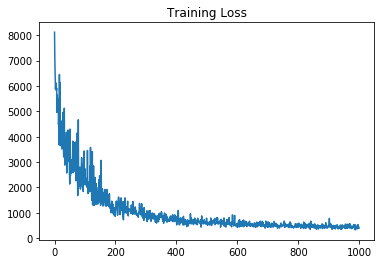

In [49]:
# TRAIN 
# Plot Training Loss
plt.plot(training_loss_array)
plt.title('Training Loss')

Text(0.5,1,'Training Loss')

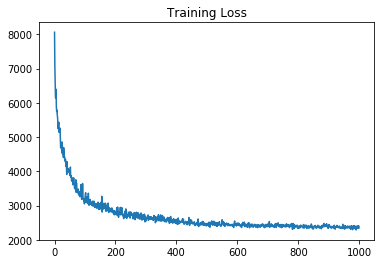

In [48]:
# TRAIN 
# Plot Training Loss
plt.plot(validation_loss_array)
plt.title('Training Loss')

#### Evaluate

In [22]:
# TEST
# Define a Function to Convert Label Image to Binary Image
def threshold_labels(img, thresh):
    # Create Binary Image
    binary_img = np.zeros((img.shape[0], img.shape[1]))
    # Create For Loops for Check ground Pixels
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            if img[i,j] > thresh:
                binary_img[i,j] = 255
            else:
                binary_img[i,j] = 0
    return binary_img

INFO:tensorflow:Restoring parameters from Model-Tensorflow/unet
Computation Time: 0.08917760848999023
Computation Time: 0.0036525726318359375
Computation Time: 0.003587007522583008
Computation Time: 0.0036253929138183594
Computation Time: 0.0035381317138671875
Computation Time: 0.0036668777465820312
Computation Time: 0.00481414794921875
Computation Time: 0.003613710403442383
Computation Time: 0.003474712371826172
Computation Time: 0.0036284923553466797
Computation Time: 0.003959178924560547
Computation Time: 0.0039098262786865234
Computation Time: 0.0034873485565185547
Computation Time: 0.0035698413848876953
Computation Time: 0.0034623146057128906
Computation Time: 0.003651142120361328
Computation Time: 0.003858804702758789
Computation Time: 0.0035648345947265625
Computation Time: 0.0034308433532714844
Computation Time: 0.0035216808319091797
Computation Time: 0.0036911964416503906
Computation Time: 0.003568887710571289
Computation Time: 0.0036339759826660156
Computation Time: 0.0035715

/home/avidbots/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Computation Time: 0.0035352706909179688
Computation Time: 0.003585338592529297
Computation Time: 0.0035560131072998047
Computation Time: 0.003599405288696289
Computation Time: 0.003761768341064453
Computation Time: 0.003515958786010742
Computation Time: 0.0034782886505126953
Computation Time: 0.003534078598022461
Computation Time: 0.0035142898559570312
Computation Time: 0.0036096572875976562
Computation Time: 0.0036160945892333984
Computation Time: 0.003614664077758789
Computation Time: 0.003674745559692383
Computation Time: 0.0035719871520996094
Computation Time: 0.003542184829711914
Computation Time: 0.003614664077758789
Computation Time: 0.003590822219848633
Computation Time: 0.0035979747772216797
Computation Time: 0.0034966468811035156
Computation Time: 0.0035462379455566406
Computation Time: 0.003573894500732422
Computation Time: 0.0035829544067382812
Computation Time: 0.003520488739013672
Computation Time: 0.003517627716064453
Computation Time: 0.0035064220428466797
Computation T

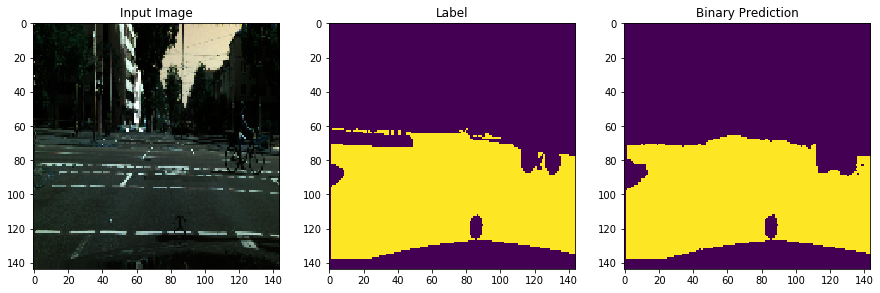

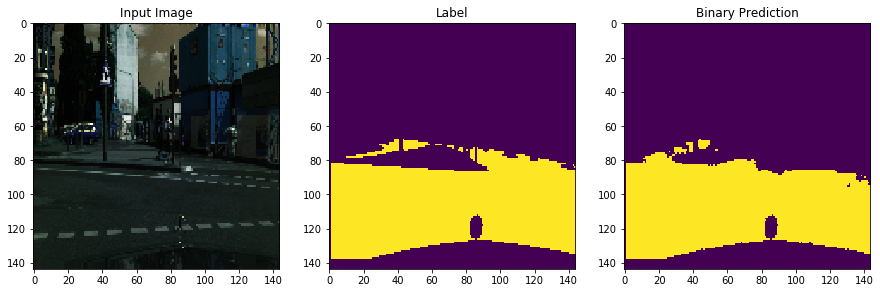

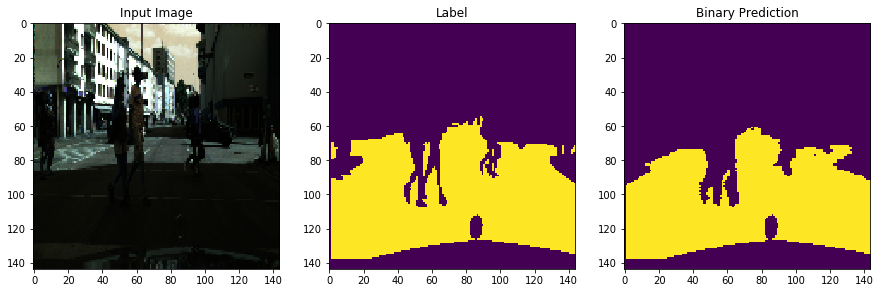

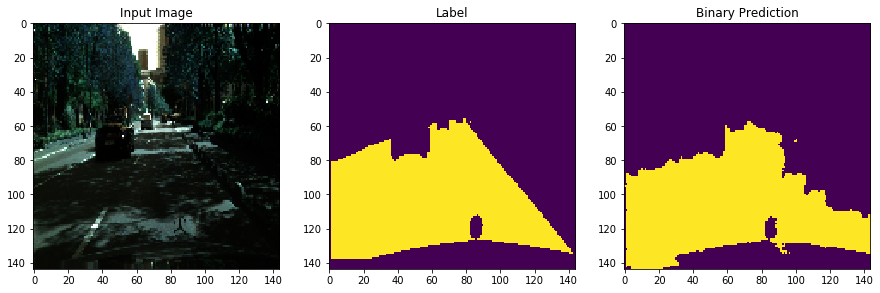

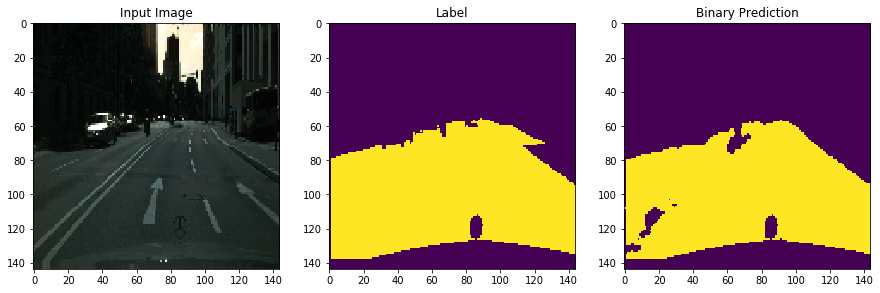

...

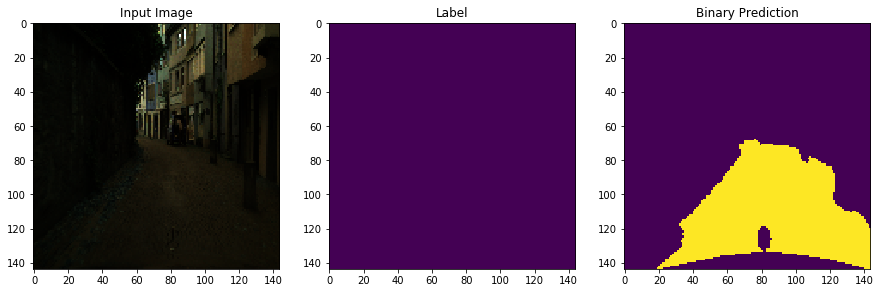

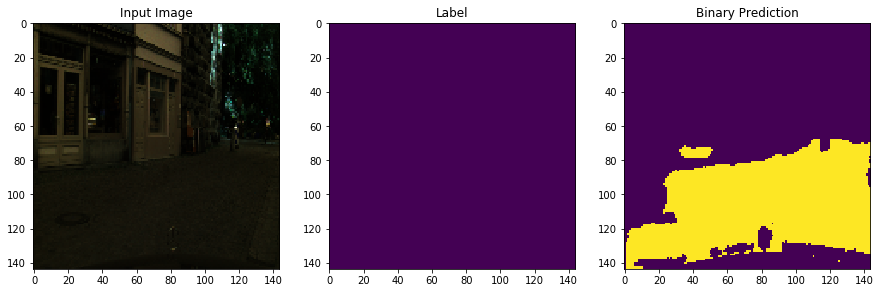

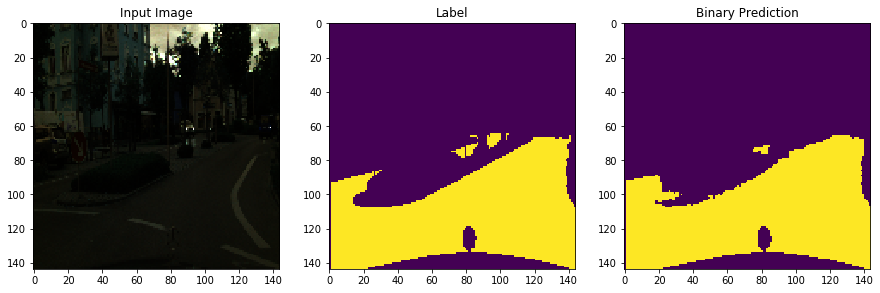

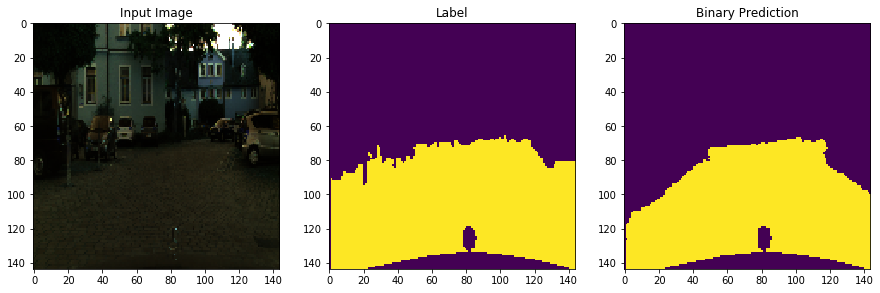

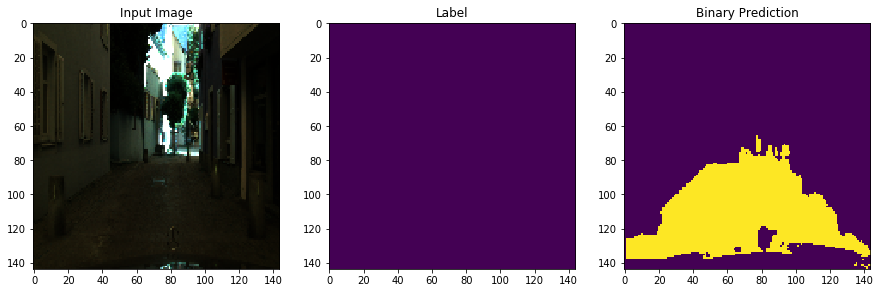

In [36]:
# Evaluate the Model on Random Images
import time
# Use Session to Infer
with tf.Session() as sess:
    saver.restore(sess,'Model-Tensorflow/unet')
    for i in range(200,300):
        # Predict
        original_image = x_valid[i]
        img = x_valid[i]
        label_image = y_valid[i]
        start_time = time.time()
        original_image = np.reshape(original_image, [-1, 144, 144, 3])
        test_data = {x:original_image}
        test_mask = sess.run([y_pred],feed_dict=test_data)
        test_mask = np.reshape(test_mask, (144,144))
        end_time = time.time()
        print('Computation Time:', end_time - start_time)
        binary_image = threshold_labels(test_mask, 150)
        
        # Resize Image
        #img = cv2.resize(img, (1024, 2048))
        #label_image = cv2.resize(label_image, (1024, 2048))
        #binary_image = cv2.resize(binary_image, (1024, 2048))
    
        # Plot
        fig, (axis1, axis2, axis3) = plt.subplots(1, 3, figsize = (15,15))
        axis1.imshow(img)
        axis1.set_title('Input Image')
        axis2.imshow(label_image[:,:,0])
        axis2.set_title('Label')
        axis3.imshow(binary_image)
        axis3.set_title('Binary Prediction')

INFO:tensorflow:Restoring parameters from Model-Tensorflow/unet
Computation Time: 0.08877992630004883
Computation Time: 0.003659486770629883
Computation Time: 0.0035893917083740234
Computation Time: 0.003603696823120117
Computation Time: 0.003512144088745117
Computation Time: 0.003521442413330078
Computation Time: 0.0036144256591796875
Computation Time: 0.003566741943359375
Computation Time: 0.0035114288330078125
Computation Time: 0.0033981800079345703
Computation Time: 0.0034859180450439453
Computation Time: 0.0035898685455322266
Computation Time: 0.0037779808044433594
Computation Time: 0.003695964813232422
Computation Time: 0.0036742687225341797
Computation Time: 0.0035355091094970703
Computation Time: 0.0035791397094726562
Computation Time: 0.003661632537841797
Computation Time: 0.0036270618438720703
Computation Time: 0.0034575462341308594
Computation Time: 0.0036554336547851562
Computation Time: 0.0035278797149658203


/home/avidbots/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Computation Time: 0.003724813461303711
Computation Time: 0.003562450408935547
Computation Time: 0.003580808639526367
Computation Time: 0.0035185813903808594
Computation Time: 0.0038673877716064453
Computation Time: 0.00362396240234375
Computation Time: 0.003626108169555664
Computation Time: 0.0036699771881103516
Computation Time: 0.0035200119018554688
Computation Time: 0.0034379959106445312
Computation Time: 0.0035505294799804688
Computation Time: 0.0035965442657470703
Computation Time: 0.003432035446166992
Computation Time: 0.0036232471466064453
Computation Time: 0.0036089420318603516
Computation Time: 0.003620147705078125
Computation Time: 0.0036454200744628906
Computation Time: 0.003629922866821289
Computation Time: 0.0035827159881591797
Computation Time: 0.0037698745727539062
Computation Time: 0.003659963607788086
Computation Time: 0.0036149024963378906
Computation Time: 0.0035676956176757812
Computation Time: 0.0034770965576171875
Computation Time: 0.0035991668701171875
Computatio

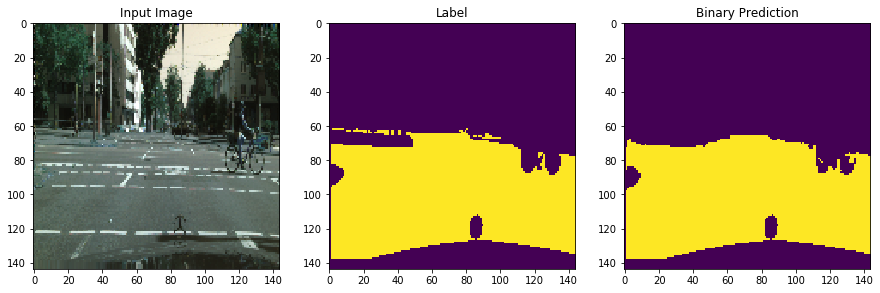

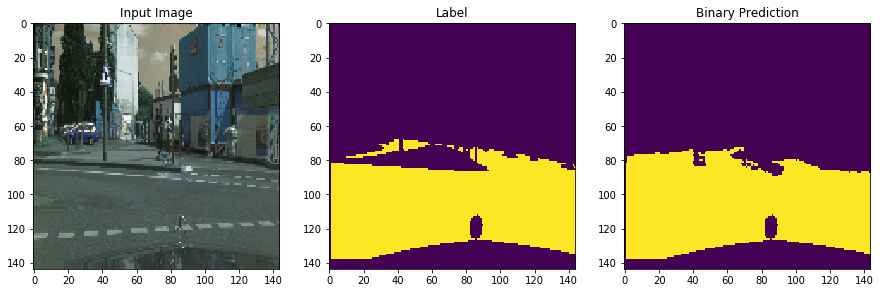

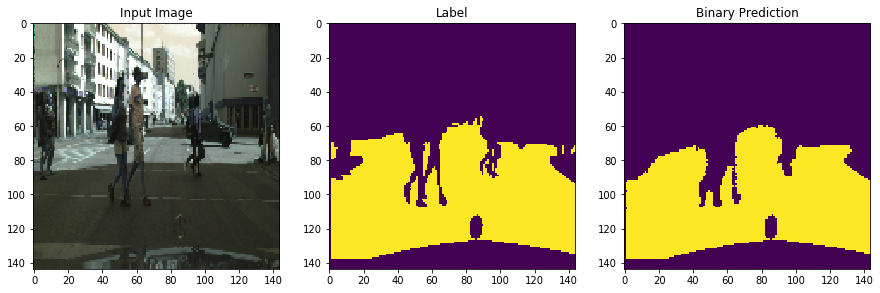

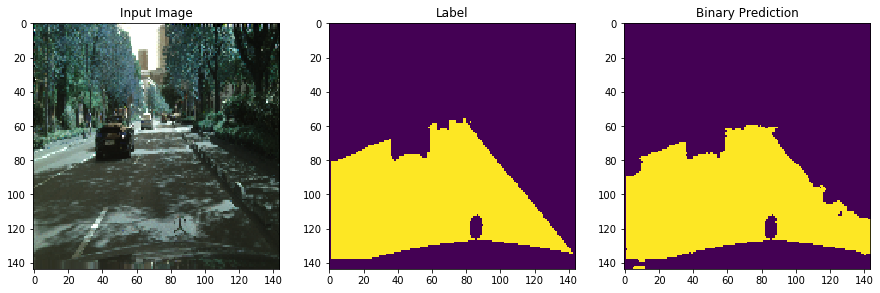

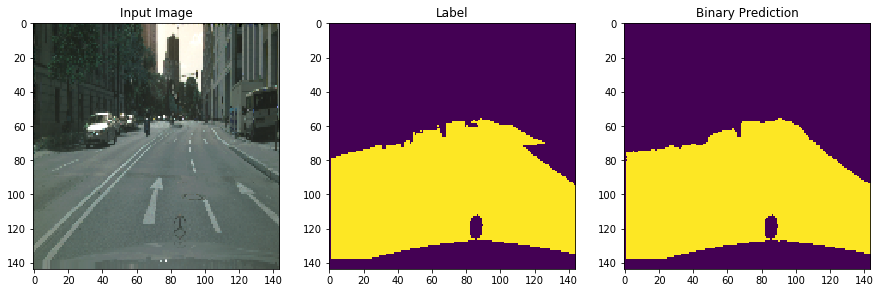

...

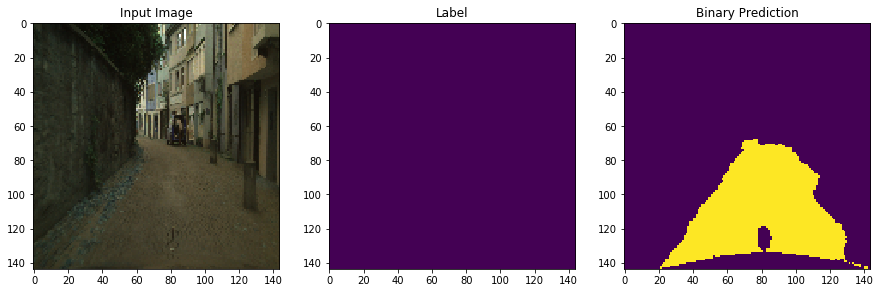

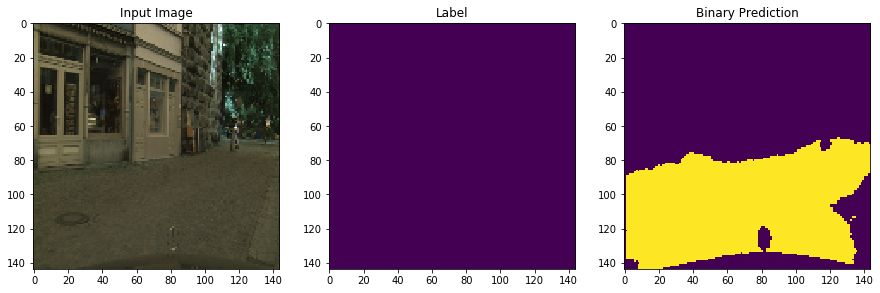

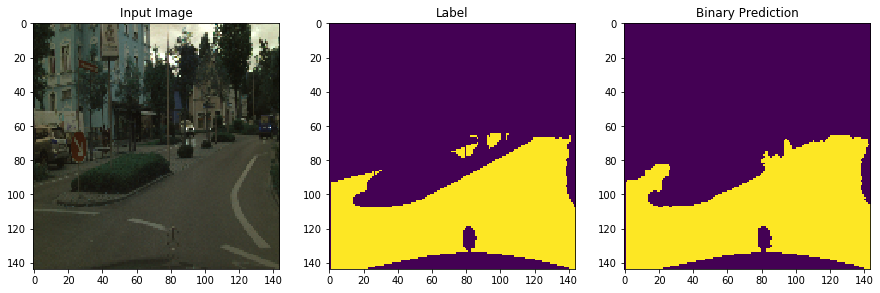

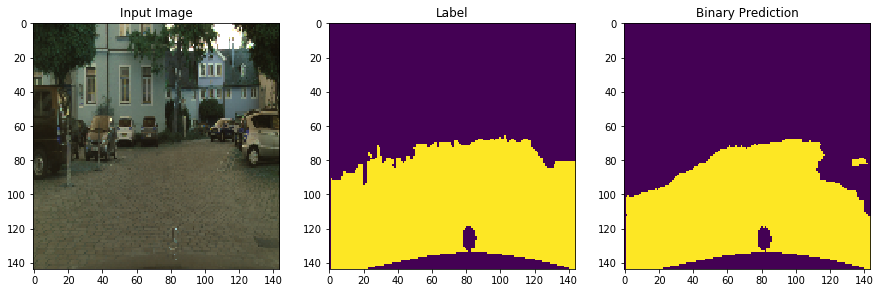

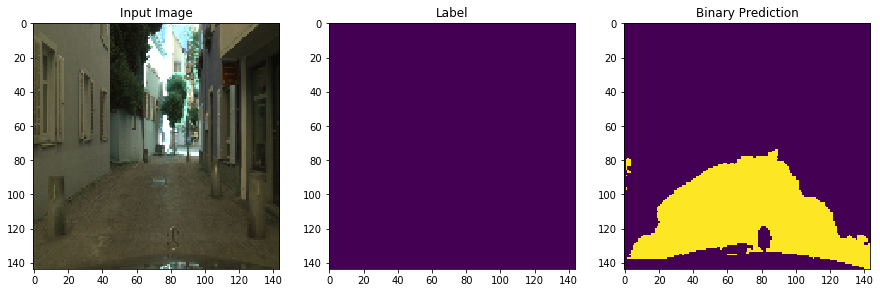

In [40]:
# Evaluate the Model on Random Images
import time
# Use Session to Infer
with tf.Session() as sess:
    saver.restore(sess,'Model-Tensorflow/unet')
    for i in range(200,300):
        # Predict
        original_image = x_valid[i]
        img = x_valid[i]
        label_image = y_valid[i]
        start_time = time.time()
        original_image = np.reshape(original_image, [-1, 144, 144, 3])
        test_data = {x:original_image}
        test_mask = sess.run([y_pred],feed_dict=test_data)
        test_mask = np.reshape(test_mask, (144,144))
        end_time = time.time()
        print('Computation Time:', end_time - start_time)
        binary_image = threshold_labels(test_mask, 150)
        
        # Resize Image
        #img = cv2.resize(img, (1024, 2048))
        #label_image = cv2.resize(label_image, (1024, 2048))
        #binary_image = cv2.resize(binary_image, (1024, 2048))
    
        # Plot
        fig, (axis1, axis2, axis3) = plt.subplots(1, 3, figsize = (15,15))
        axis1.imshow(img)
        axis1.set_title('Input Image')
        axis2.imshow(label_image[:,:,0])
        axis2.set_title('Label')
        axis3.imshow(binary_image)
        axis3.set_title('Binary Prediction')

In [ ]:
# TEST
# Import Modules
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function
import argparse
import sys
import tempfile
from tensorflow.examples.tutorials.mnist import input_data
import tensorflow as tf
from tensorflow.python.framework import graph_io

# Load Model
saver = tf.train.import_meta_graph('./Model-Tensorflow/unet.meta', clear_devices=True)
graph = tf.get_default_graph()
input_graph_def = graph.as_graph_def()
sess = tf.Session()
saver.restore(sess, "./Model-Tensorflow/unet")
print('Model Loaded!')

In [ ]:
# TEST
# Convert Model
output_node_names="y_pred"
output_graph_def = tf.graph_util.convert_variables_to_constants(sess, input_graph_def, output_node_names.split(","))
print('Model Converted!')

# Save Frozen Model
graph_io.write_graph(output_graph_def, './', './Model-Tensorflow/unet-benchmark.pb', as_text=False)
sess.close()
print('File Saved!')

In [ ]:
# TEST
# Load Model
frozen_graph="./Model-Tensorflow/unet-benchmark.pb"
with tf.gfile.GFile(frozen_graph, "rb") as f:
      graph_def = tf.GraphDef()
      graph_def.ParseFromString(f.read()) 
with tf.Graph().as_default() as graph:
      tf.import_graph_def(graph_def,
                          input_map=None,
                          return_elements=None,
                          name="")
y_pred = graph.get_tensor_by_name("y_pred:0")

# Start Session
sess= tf.Session(graph=graph)

# Predict in Loop
for i in range(400, 500):
    # Load Images from Validation
    original_image = x_valid[i]
    img = x_valid[i]
    label_image = y_valid[i]
    
    # Resize the Image to the desired Size, Preprocessing will be done exactly as done during Training
    original_image = np.reshape(original_image, [-1, 144, 144, 3])
    
    # Initialize
    images = []
    images.append(original_image)
    images = np.array(images, dtype=np.uint8)
    images = images.astype('float32')

    # NOTE: The input to the network is of shape [None image_size image_size num_channels]. 
    # Reshape Image
    x_batch = images.reshape(1, 144, 144, 3)

    # Feed the Images to the Input Placeholders
    x = graph.get_tensor_by_name("x:0")

    # Create the 'feed_dict', Required to be fed to Calculate 'y_pred' 
    feed_dict_testing = {x: x_batch}

    # Run Inference
    start_time = time.time()
    result=sess.run(y_pred, feed_dict=feed_dict_testing)
    test_mask = np.array(result).reshape(144,144)
    end_time = time.time()
    print('Computation Time:', end_time - start_time)
    binary_image = threshold_labels(test_mask, 100)

    # Resize Image
    label_image = resize(label_image, (200, 560), anti_aliasing=True)
    binary_image = resize(binary_image, (200, 560), anti_aliasing=True)

    # Plot
    fig, (axis1, axis2, axis3) = plt.subplots(1, 3, figsize = (12,12))
    axis1.imshow(image[:,:,0])
    axis1.set_title('Input Image')
    axis2.imshow(label_image[:,:,0])
    axis2.set_title('Label Image')
    axis3.imshow(binary_image)
    axis3.set_title('Binary Prediction')